# Task A

In [1]:
import numpy as np
import cv2
from skimage.util import random_noise
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio
import os
from matplotlib.pyplot import figure
import skimage.io
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from tqdm.notebook import tqdm

#Adjust figure sizes 
rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100

C:\Users\Mira\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Mira\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\Mira\anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


# a.  Mean Filter

In [2]:
def Mean_filter(noisy_im_dir, org_im_dir, img_to_print):
    lst_mean_noisy = []
    lst_mse_3x3_filt = []
    lst_mse_5x5_filt = []
    lst_mse_7x7_filt = []

    lst_ssim_noisy = []
    lst_ssim_3x3_filt = []
    lst_ssim_5x5_filt = []
    lst_ssim_7x7_filt = []

    # Process each image
    for e, i in enumerate(os.listdir(noisy_im_dir)):

        img_name = i.split(".")[0]+".png"

        noisy_img = cv2.cvtColor(cv2.imread(os.path.join(noisy_im_dir, img_name)), cv2.COLOR_BGR2RGB)
        org_img   = cv2.cvtColor(cv2.imread(os.path.join(org_im_dir, img_name)), cv2.COLOR_BGR2RGB)
        

        #------------------------------------------------------------
        # Apply Filters
        #------------------------------------------------------------

        img_mean_3x3_filt = cv2.blur(noisy_img, (3,3))               # Mean filter with kernel 3*3
        img_mean_5x5_filt = cv2.blur(noisy_img, (5,5))               # Mean filter with kernel 5*5
#         img_mean_7x7_filt = cv2.blur(noisy_img, (7,7))               # Mean filter with kernel 7*7

        #------------------------------------------------------------
        # Mean Squared Error between Original image and filtered images
        #------------------------------------------------------------
        #

        mse_noisy = np.mean((org_img - noisy_img)**2).astype(np.uint8)
        lst_mean_noisy.append(mse_noisy)

        mse_3x3_filt = np.mean((org_img - img_mean_3x3_filt)**2).astype(np.uint8)
        lst_mse_3x3_filt.append(mse_3x3_filt)

        mse_5x5_filt = np.mean((org_img - img_mean_5x5_filt)**2).astype(np.uint8)
        lst_mse_5x5_filt.append(mse_5x5_filt)    


        #------------------------------------------------------------------------------------
        #Calcalte Structured Similarity Index with Original image and filtered images
        #------------------------------------------------------------------------------------
        ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
        lst_ssim_noisy.append(ssim_noisy)

        ssim_3x3_filt = ssim(org_img, img_mean_3x3_filt, multichannel=True, data_range=img_mean_3x3_filt.max() - img_mean_3x3_filt.min())
        lst_ssim_3x3_filt.append(ssim_3x3_filt)

        ssim_5x5_filt = ssim(org_img, img_mean_5x5_filt, multichannel=True, data_range=img_mean_5x5_filt.max() - img_mean_5x5_filt.min())
        lst_ssim_5x5_filt.append(ssim_5x5_filt)

 
        # Display the filtered sample image
    
        if e== img_to_print:
            #------------------------------------------------------------
            # Display images
            #------------------------------------------------------------
            rcParams['figure.figsize'] = [12, 8]
            plt.rcParams['figure.dpi'] = 100            

            plt.subplot(131), plt.imshow(noisy_img)
            plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_noisy}, SSIM: {ssim_noisy:.2f}')

            plt.subplot(132), plt.imshow(img_mean_3x3_filt)
            plt.title('Mean 3x3 filtered img'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_3x3_filt}, SSIM: {ssim_3x3_filt:.2f}')

            plt.subplot(133), plt.imshow(img_mean_5x5_filt)
            plt.title('Mean 5x5 filtered img'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_5x5_filt}, SSIM: {ssim_5x5_filt:.2f}')

            plt.show()

    
    #------------------------------------
    # Plots
    #------------------------------------
    #Adjust figure sizes
    rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['figure.dpi'] = 100
    X_axis=np.arange(0,25)
    X_axis1 = X_axis
    X_axis2 = X_axis + 0.2
    X_axis3 = X_axis+0.2*2
#     X_axis4 = X_axis+0.2*3

    #------------------------------------------------------------
    # Plot Mean Squared Error for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_mean_noisy, 0.2, label='Noisy Img')
    plt.bar(X_axis2, lst_mse_3x3_filt, 0.2, label='3x3_filt')
    plt.bar(X_axis3, lst_mse_5x5_filt, 0.2, label='5x5_filt')
#     plt.bar(X_axis4, lst_mse_7x7_filt, 0.2, label='7x7_filt')
    plt.xlabel('Image Number')
    plt.ylabel('MSE')
    plt.title('Mean Squared Error')
    plt.legend()
    plt.show()

    #------------------------------------------------------------
    # Plot Structued Similarity Index for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_ssim_noisy, 0.2, label='Noisy Img')
    plt.bar(X_axis2, lst_ssim_3x3_filt, 0.2, label='3x3_filt')
    plt.bar(X_axis3, lst_ssim_5x5_filt, 0.2, label='5x5_filt')
#     plt.bar(X_axis4, lst_ssim_7x7_filt, 0.2, label='7x7_filt')
    plt.xlabel('Image Number')
    plt.ylabel('SSIM')
    plt.title('Structued Similarity Index')
    plt.legend()
    plt.show()
    
    # Return the results of filters 3x3 and 5x5
    return lst_mse_3x3_filt, lst_mse_5x5_filt, lst_ssim_3x3_filt, lst_ssim_5x5_filt, lst_mean_noisy, lst_ssim_noisy


## Noisy10_ Images - Mean Filter

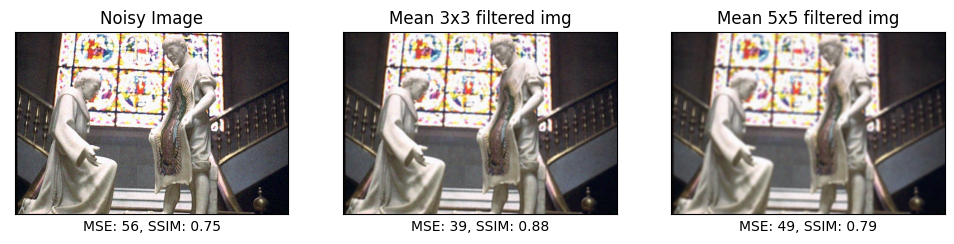

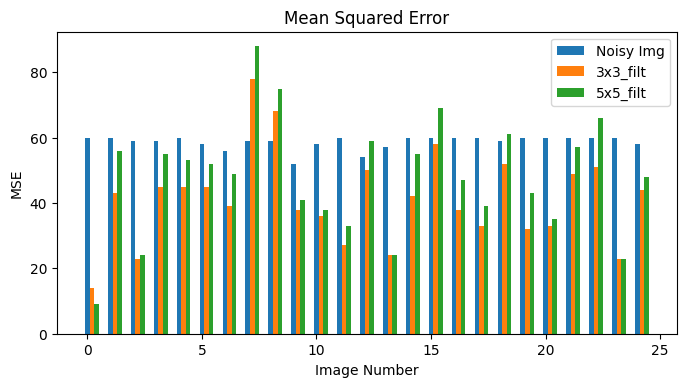

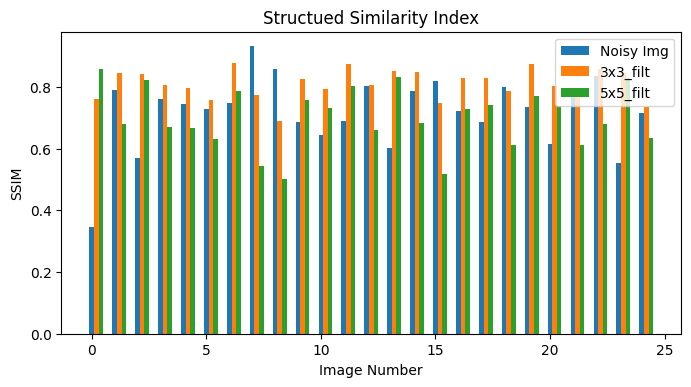

In [3]:
#Access image datasets
noisy10_im_dir = 'Task-A-Dataset-denoising\\noisy10'   # Noisy Images
org_im_dir = 'Task-A-Dataset-denoising\\original'      # Original Images
img_to_print = 6                                       # Sample image to be printed

n10_mse_mean_3x3, n10_mse_mean_5x5, n10_ssim_mean_3x3, n10_ssim_mean_5x5, n10_mean_noisy, n10_ssim_noisy = Mean_filter( \
    noisy10_im_dir, org_im_dir, img_to_print)
                                                                                                       

## Noisy25_ Images - Mean Filter

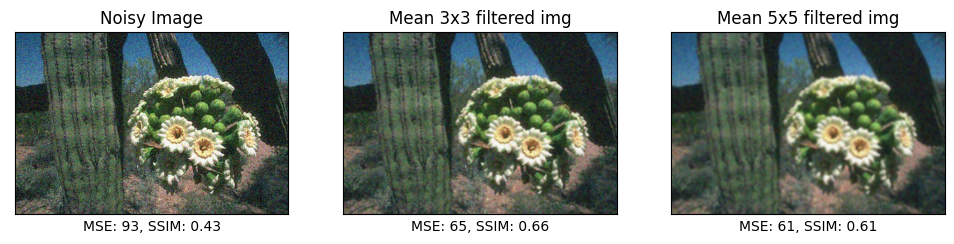

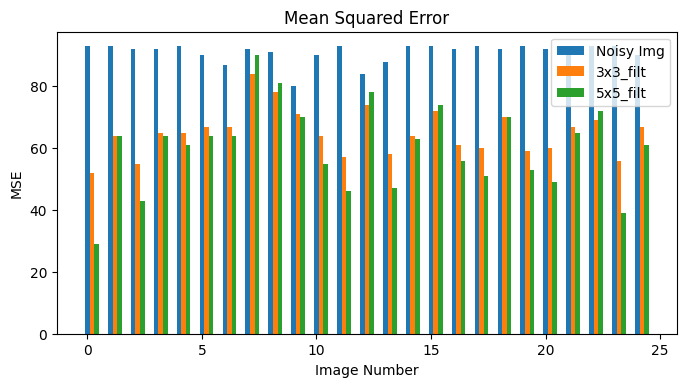

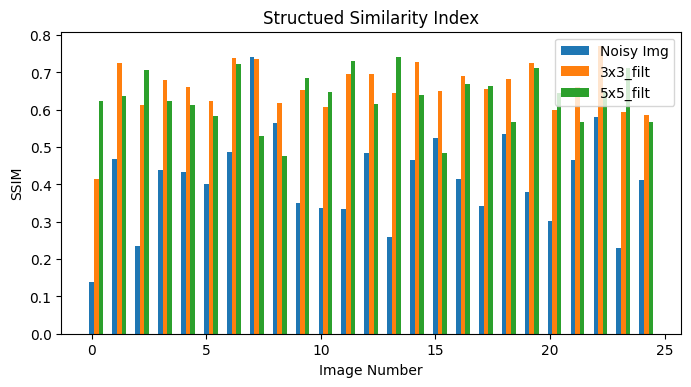

In [4]:
#Access image datasets
noisy25_im_dir = "Task-A-Dataset-denoising\\noisy25"        # Noisy Images
org_im_dir = "Task-A-Dataset-denoising\\original"           # Original Images
img_to_print = 4                                            # Sample image to be printed

n25_mse_mean_3x3, n25_mse_mean_5x5, n25_ssim_mean_3x3, n25_ssim_mean_5x5, n25_mean_noisy, n25_ssim_noisy = Mean_filter(noisy25_im_dir, \
                                                                                           org_im_dir, img_to_print)

## Noisy50_ Images - Mean Filter

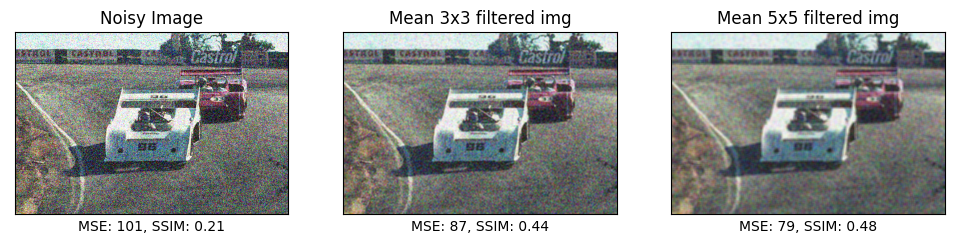

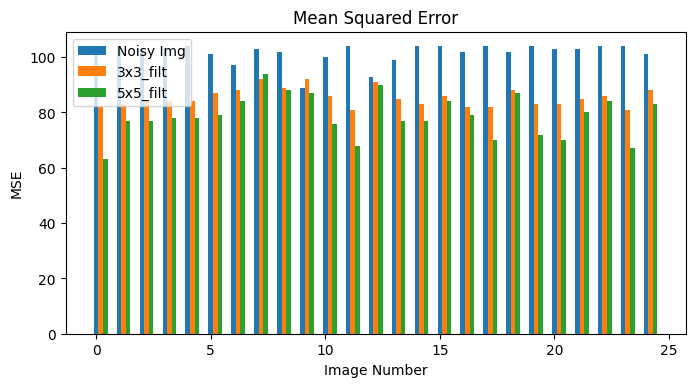

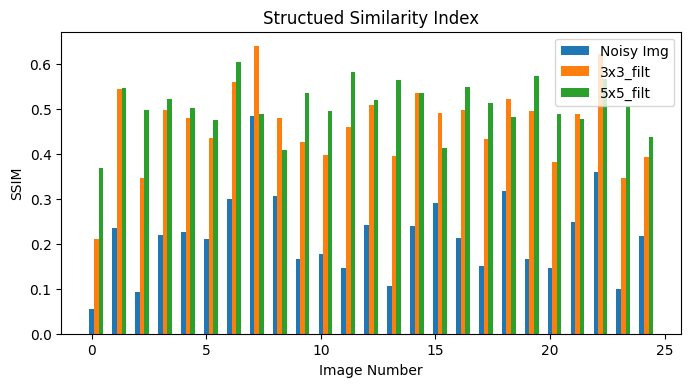

In [5]:
#Access image datasets
noisy50_im_dir = "Task-A-Dataset-denoising\\noisy50"      # Noisy Images
org_im_dir = "Task-A-Dataset-denoising\\original"         # Original Images
img_to_print = 5                                          # Sample image to be printed

n50_mse_mean_3x3, n50_mse_mean_5x5, n50_ssim_mean_3x3, n50_ssim_mean_5x5, n50_mean_noisy, n50_ssim_noisy = Mean_filter(noisy50_im_dir, \
                                                                                           org_im_dir, img_to_print)

# B-  Median Filter

In [6]:
def Median_filter(noisy_im_dir, org_im_dir, img_to_print):
    lst_mse_noisy = []
    lst_mse_3_filt = []
    lst_mse_5_filt = []
    lst_mse_7_filt = []

    lst_ssim_noisy = []
    lst_ssim_3x3_filt = []
    lst_ssim_5x5_filt = []
    lst_ssim_7x7_filt = []

    for e, i in enumerate(os.listdir(noisy_im_dir)):
        
        img_name = i.split(".")[0]+".png"

        noisy_img = cv2.cvtColor(cv2.imread(os.path.join(noisy_im_dir, img_name)), cv2.COLOR_BGR2RGB)    # Noisy Images
        org_img   = cv2.cvtColor(cv2.imread(os.path.join(org_im_dir, img_name)), cv2.COLOR_BGR2RGB)      # Original Images

        #------------------------------------------------------------
        # Apply Filters
        #------------------------------------------------------------

        img_median_3_filt = cv2.medianBlur(noisy_img, 3)                   # Median filter with kernel 3*3
        img_median_5_filt = cv2.medianBlur(noisy_img, 5)                   # Median filter with kernel 5*5

        #------------------------------------------------------------
        # Mean Squared Error between Original image and filtered images
        #------------------------------------------------------------

        mse_noisy = np.mean((org_img - noisy_img)**2).astype(np.uint8)
        lst_mse_noisy.append(mse_noisy)
        
        mse_3_filt = np.mean((org_img - img_median_3_filt)**2).astype(np.uint8)
        lst_mse_3_filt.append(mse_3_filt)
        
        mse_5_filt = np.mean((org_img - img_median_5_filt)**2).astype(np.uint8)
        lst_mse_5_filt.append(mse_5_filt)
        

        #------------------------------------------------------------------------------------
        #Calcalte Structured Similarity Index with Original image and filtered images
        #------------------------------------------------------------------------------------
        ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
        lst_ssim_noisy.append(ssim_noisy)
        
        ssim_3x3_filt = ssim(org_img, img_median_3_filt, multichannel=True, data_range=img_median_3_filt.max() - img_median_3_filt.min())
        lst_ssim_3x3_filt.append(ssim_3x3_filt)
        
        ssim_5x5_filt = ssim(org_img, img_median_5_filt, multichannel=True, data_range=img_median_5_filt.max() - img_median_5_filt.min())
        lst_ssim_5x5_filt.append(ssim_5x5_filt)
        

        if e==img_to_print:
            # Display the filtered image
            #------------------------------------------------------------
            # Display images
            #------------------------------------------------------------
            rcParams['figure.figsize'] = [12, 8]
            plt.rcParams['figure.dpi'] = 100 
            
            plt.subplot(131), plt.imshow(noisy_img)
            plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_noisy}, SSIM: {ssim_noisy:.2f}')

            plt.subplot(132), plt.imshow(img_median_3_filt)
            plt.title('Median 3x3 filtered img'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_3_filt}, SSIM: {ssim_3x3_filt:.2f}')

            plt.subplot(133), plt.imshow(img_median_5_filt)
            plt.title('Median 5x5 filtered img'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_5_filt}, SSIM: {ssim_5x5_filt:.2f}')
            plt.show()

    #------------------------------------
    # Plots
    #------------------------------------
    #Adjust figure sizes
    rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['figure.dpi'] = 100
    X_axis=np.arange(0,25)
    X_axis1 = X_axis
    X_axis2 = X_axis + 0.2
    X_axis3 = X_axis+0.2*2

    #------------------------------------------------------------
    # Plot Mean Squared Error for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_mse_noisy, 0.2, label='Noisy Img')
    plt.bar(X_axis2, lst_mse_3_filt, 0.2, label='3x3_filt')
    plt.bar(X_axis3, lst_mse_5_filt, 0.2, label='5x5_filt')
    plt.xlabel('Image Number')
    plt.ylabel('MSE')
    plt.title('Mean Squared Error')
    plt.legend()
    plt.show()

    #------------------------------------------------------------
    # Plot Structued Similarity Index for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_ssim_noisy, 0.2, label='Noisy Img')
    plt.bar(X_axis2, lst_ssim_3x3_filt, 0.2, label='3x3_filt')
    plt.bar(X_axis3, lst_ssim_5x5_filt, 0.2, label='5x5_filt')
    plt.xlabel('Image Number')
    plt.ylabel('SSIM')
    plt.title('Structued Similarity Index')
    plt.legend()
    plt.show()
    
    # Return the results of filters 3x3 and 5x5
    return lst_mse_3_filt, lst_mse_5_filt, lst_ssim_3x3_filt, lst_ssim_5x5_filt


## Noisy10_ Images - Median Filter

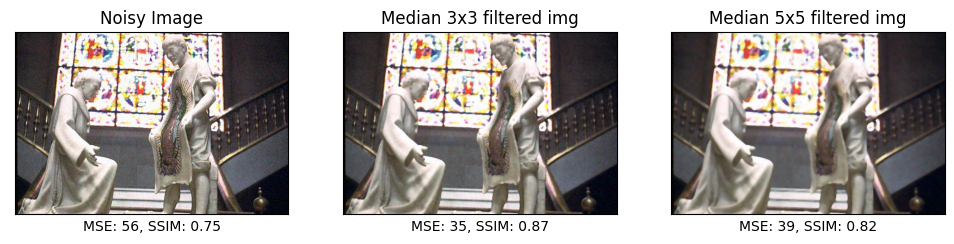

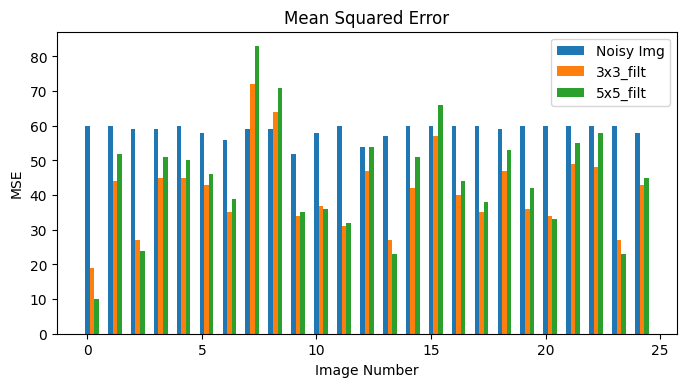

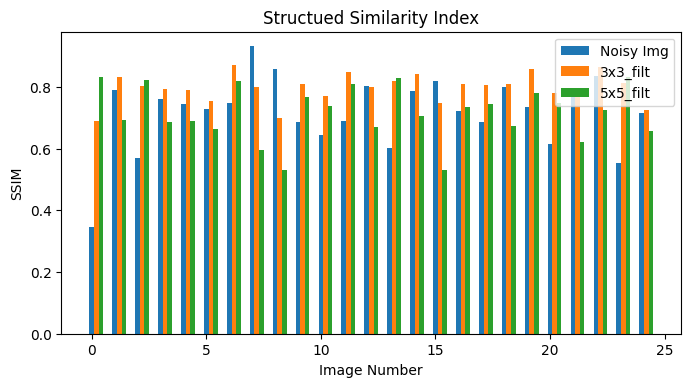

In [7]:
#Access image datasets
noisy10_im_dir = 'Task-A-Dataset-denoising\\noisy10'
org_im_dir = 'Task-A-Dataset-denoising\\original'
img_to_print = 6

n10_mse_med_3x3, n10_mse_med_5x5, n10_ssim_med_3x3, n10_ssim_med_5x5 = Median_filter(noisy10_im_dir, \
                                                                                         org_im_dir, img_to_print)

## Noisy25_ Images - Median Filter

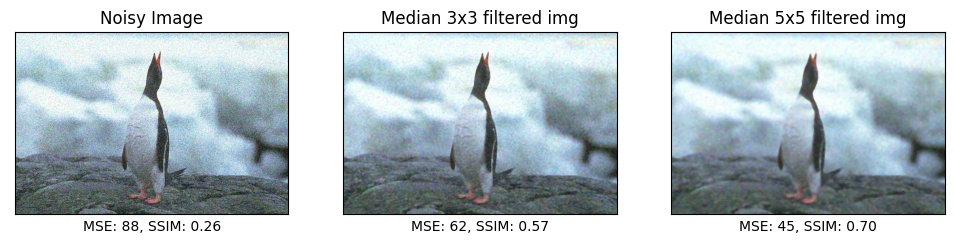

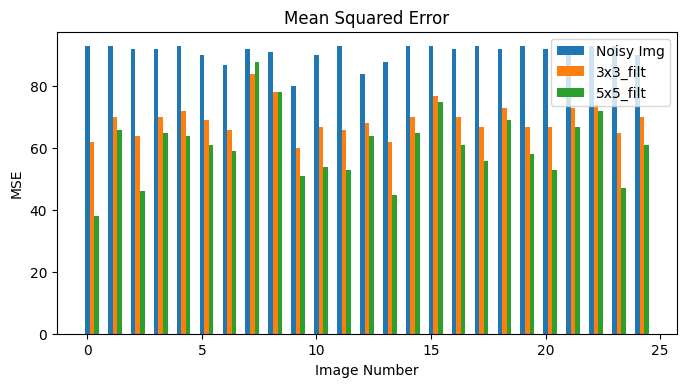

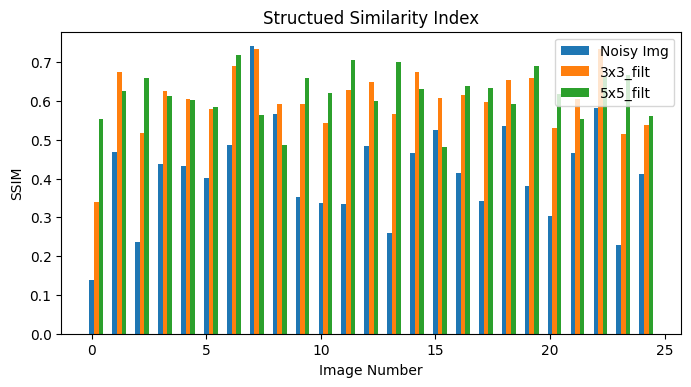

In [8]:
#Access image datasets
noisy25_im_dir = 'Task-A-Dataset-denoising\\noisy25'
org_im_dir = 'Task-A-Dataset-denoising\\original'

img_to_print = 13

n25_mse_med_3x3, n25_mse_med_5x5, n25_ssim_med_3x3, n25_ssim_med_5x5 = Median_filter(noisy25_im_dir, org_im_dir, \
                                                                                         img_to_print)

## Noisy50_ Images - Median Filter

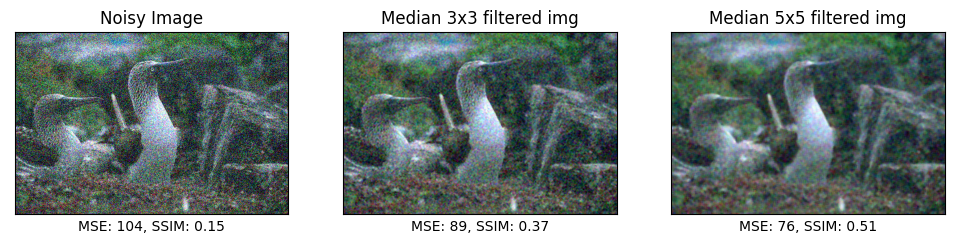

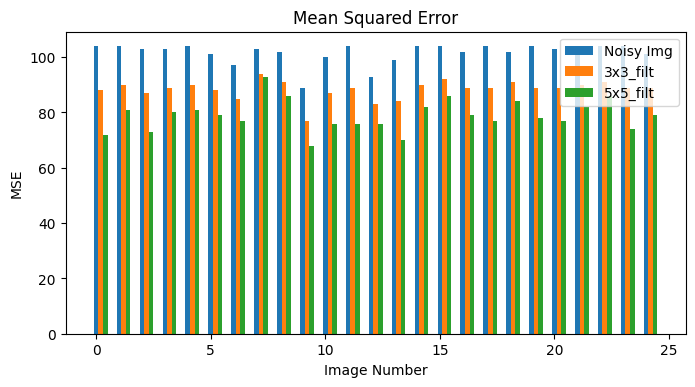

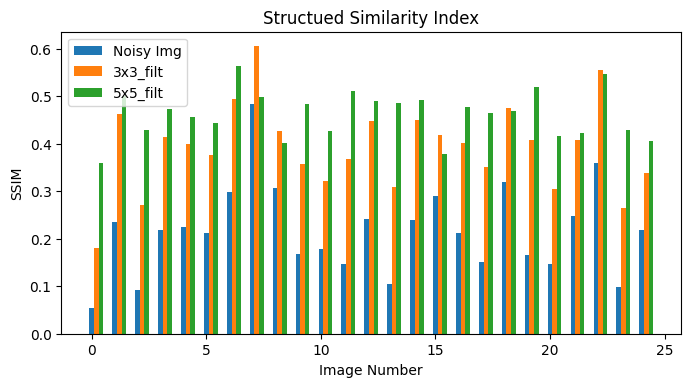

In [9]:
#Access image datasets
noisy50_im_dir = "Task-A-Dataset-denoising\\noisy50"
org_im_dir = "Task-A-Dataset-denoising\\original"
img_to_print = 11

n50_mse_med_3x3, n50_mse_med_5x5, n50_ssim_med_3x3, n50_ssim_med_5x5 = Median_filter(noisy50_im_dir, org_im_dir, \
                                                                                        img_to_print)

# c. Wavelet Filter

In [10]:
def Wavelet_filter(noisy_im_dir, org_im_dir, img_to_print):
    lst_img_name = []
    lst_mse_noisy = []
    lst_mse_bayes = []
    lst_mse_visus1 = []
    lst_mse_visus2 = []

    lst_ssim_noisy = []
    lst_ssim_bayes = []
    lst_ssim_visus1 = []
    lst_ssim_visus2 = []
    for e, i in enumerate(os.listdir(noisy_im_dir)):
        img_name = i.split(".")[0]+".png"
        lst_img_name.append(img_name)

        noisy_img = cv2.cvtColor(cv2.imread(os.path.join(noisy_im_dir, img_name)), cv2.COLOR_BGR2RGB)    # Noisy Images
        noisy_img = skimage.img_as_float(noisy_img)

        org_img   = cv2.cvtColor(cv2.imread(os.path.join(org_im_dir, img_name)),  cv2.COLOR_BGR2RGB)     # Original Images
        org_img   = skimage.img_as_float(org_img)

        # Average noise standard deviation
        sigma_sd = estimate_sigma(noisy_img, average_sigmas = True, multichannel = True)

        #----------------------------------------------------------------------------------
        # Apply Filters
        #----------------------------------------------------------------------------------    

        # Haar wavelet with BayesShrink method  
        im_bayes = denoise_wavelet(noisy_img, multichannel = True, wavelet='Haar', method='BayesShrink',  \
                                convert2ycbcr=True, mode='soft', rescale_sigma=True, wavelet_levels=3)

        # Haar wavelet with VisuShrink method sigma east 
        im_visus1 = denoise_wavelet(noisy_img, multichannel = True, wavelet='Haar', method='VisuShrink', \
                                convert2ycbcr=True, sigma=sigma_sd, mode='soft', rescale_sigma=True, wavelet_levels=3)

        # Haar wavelet with VisuShrink method sigma east/2 
        im_visus2 = denoise_wavelet(noisy_img, multichannel = True, wavelet='Haar', method='VisuShrink', \
                                convert2ycbcr=True, sigma=sigma_sd/2, mode='soft', rescale_sigma=True, wavelet_levels=3)


        #-----------------------------------------------------------------------------------
        # Mean Squared Error between Original image and filtered images
        #-----------------------------------------------------------------------------------

        org_img   = (org_img*255).astype('uint8')
        noisy_img = (noisy_img*255).astype('uint8')
        im_bayes  = (im_bayes*255).astype('uint8')
        im_visus1 = (im_visus1*255).astype('uint8')
#         im_visus2 = (im_visus2*255).astype('uint8')

        mse_noisy  = np.mean((org_img - noisy_img)**2)
        lst_mse_noisy.append(mse_noisy)
        
        mse_bayes  = np.mean((org_img - im_bayes)**2)
        lst_mse_bayes.append(mse_bayes)
        
        mse_visus1 = np.mean((org_img - im_visus1)**2)
        lst_mse_visus1.append(mse_visus1)
        

        #------------------------------------------------------------------------------------
        # Structured Similarity Index with Original image and filtered images
        #------------------------------------------------------------------------------------

        ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
        ssim_bayes = ssim(org_img, im_bayes, multichannel=True, data_range=im_bayes.max() - im_bayes.min())
        ssim_visus1 = ssim(org_img, im_visus1, multichannel=True, data_range=im_visus1.max() - im_visus1.min())
        
        lst_ssim_noisy.append(ssim_noisy)
        lst_ssim_bayes.append(ssim_bayes)
        lst_ssim_visus1.append(ssim_visus1)

        if e==img_to_print:    
            #----------------------------------------------------------------------------------
            # Display images
            #----------------------------------------------------------------------------------
            rcParams['figure.figsize'] = [12, 8]
            plt.rcParams['figure.dpi'] = 100 
            
            plt.subplot(131), plt.imshow(noisy_img)
            plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_noisy:.2f}, SSIM: {ssim_noisy:.2f}')
            plt.subplot(132), plt.imshow(im_bayes)
            plt.title('BayesShrink'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_bayes:.2f}, SSIM: {ssim_bayes:.2f}')
            plt.subplot(133), plt.imshow(im_visus1)
            plt.title('VisuShrink_sigma_1'), plt.xticks([]), plt.yticks([])
            plt.xlabel(f'MSE: {mse_visus1:.2f}, SSIM: {ssim_visus1:.2f}')
            plt.show()
            
    #------------------------------------
    # Plots
    #------------------------------------
    #Adjust figure sizes
    rcParams['figure.figsize'] = [10, 4]
    plt.rcParams['figure.dpi'] = 100
    X_axis = np.arange(len(lst_img_name))
    X_axis1 = X_axis
    X_axis2 = X_axis + 0.2
    X_axis3 = X_axis+0.2*2
    
    #------------------------------------------------------------
    # Plot Mean Squared Error for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_mse_noisy, 0.2, label='Noisy Imgs')
    plt.bar(X_axis2, lst_mse_bayes, 0.2, label='HAAR_bayes')
    plt.bar(X_axis3, lst_mse_visus1, 0.2, label='HAAR_visus1')
    plt.xlabel('Image Number')
    plt.ylabel('MSE')
    plt.title('Mean Squared Error')
    plt.legend()
    plt.show()

    #------------------------------------------------------------
    # Plot Structued Similarity Index for each image
    #------------------------------------------------------------
    plt.bar(X_axis1, lst_ssim_noisy, 0.2, label='Noisy Imgs')
    plt.bar(X_axis2, lst_ssim_bayes, 0.2, label='HAAR_bayes')
    plt.bar(X_axis3, lst_ssim_visus1, 0.2, label='HAAR_visus1')
    plt.xlabel('Image Number')
    plt.ylabel('SSIM')
    plt.title('Structued Similarity Index')
    plt.legend()
    plt.show()   
    
    return lst_mse_bayes, lst_mse_visus1, lst_ssim_bayes, lst_ssim_visus1
    

## Noisy10_ Images - Wavelet Filter

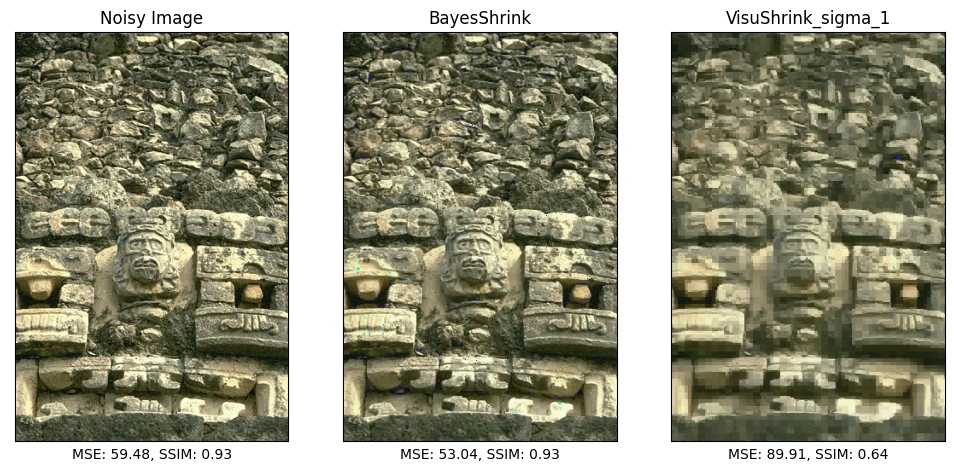

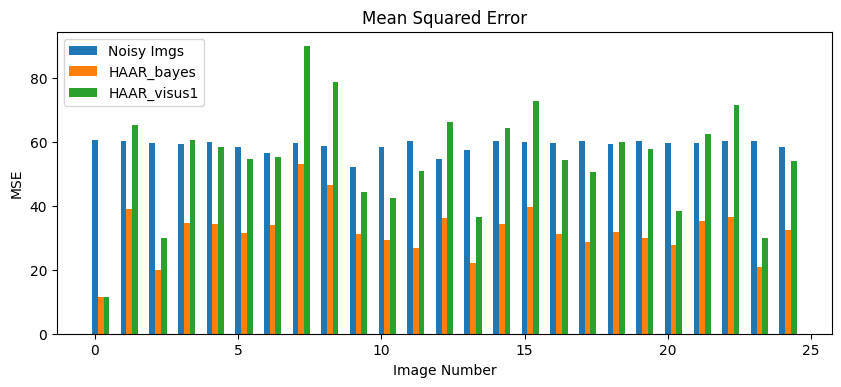

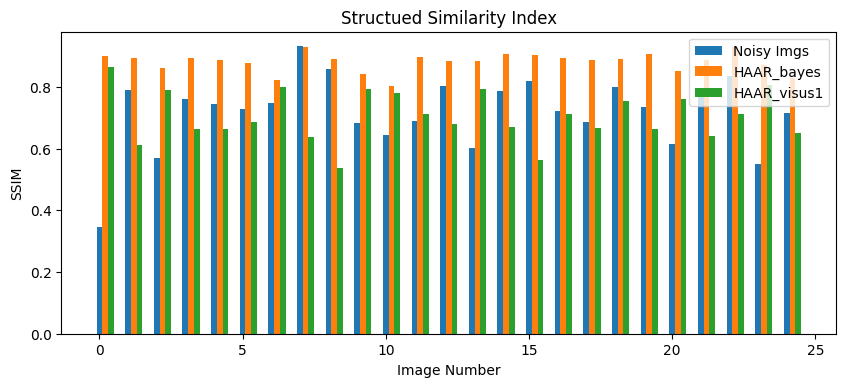

In [11]:
#Access image datasets
noisy10_im_dir = 'Task-A-Dataset-denoising\\noisy10'
org_im_dir = 'Task-A-Dataset-denoising\\original'
img_to_print = 7

n10_mse_bayes, n10_mse_visus1, n10_ssim_bayes, n10_ssim_visus1 = Wavelet_filter(noisy10_im_dir, org_im_dir, \
                                                                                      img_to_print)

## Noisy25_ Images - Wavelet Filter

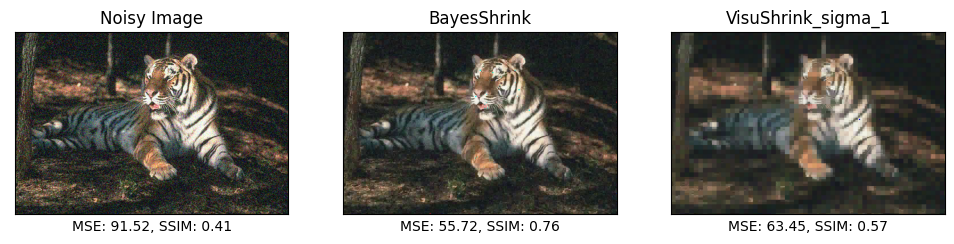

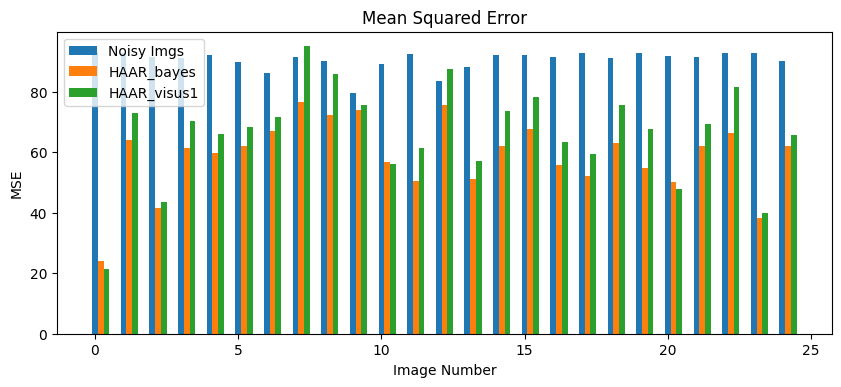

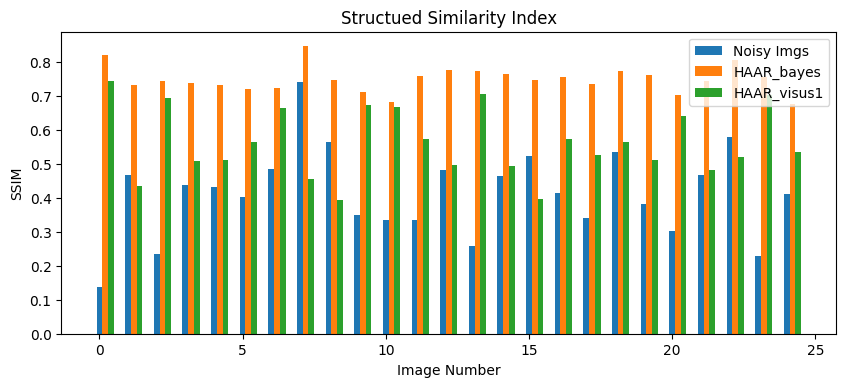

In [12]:
#Access image datasets
noisy25_im_dir = 'Task-A-Dataset-denoising\\noisy25'
org_im_dir = 'Task-A-Dataset-denoising\\original'
img_to_print = 16

n25_mse_bayes, n25_mse_visus1, n25_ssim_bayes, n25_ssim_visus1 = Wavelet_filter(noisy25_im_dir, org_im_dir, \
                                                                                      img_to_print)

## Noisy50_ Images - Wavelet Filter

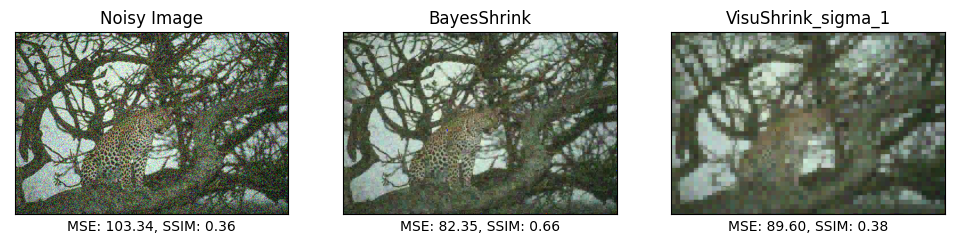

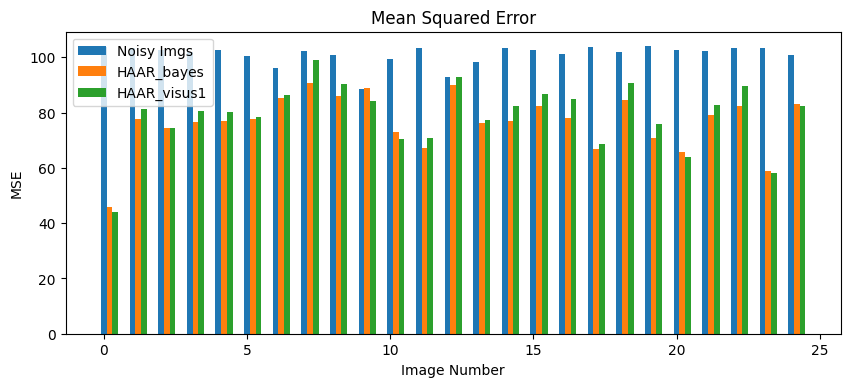

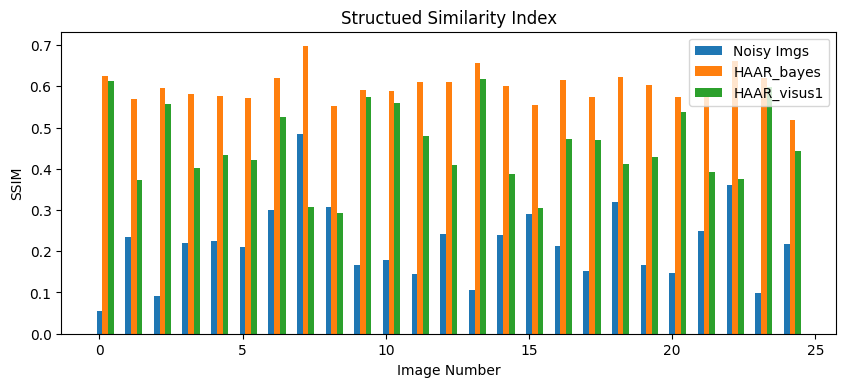

In [13]:
#Access image datasets
noisy50_im_dir = 'Task-A-Dataset-denoising\\noisy50'
org_im_dir = 'Task-A-Dataset-denoising\\original'
img_to_print = 22

n50_mse_bayes, n50_mse_visus1, n50_ssim_bayes, n50_ssim_visus1 = Wavelet_filter(noisy50_im_dir, org_im_dir, \
                                                                                      img_to_print)

# Deep Learning 

## Deep Learning_Pre_trained_model

In [14]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose,\
                                    GlobalAveragePooling2D, AveragePooling2D, MaxPool2D, UpSampling2D,\
                                    BatchNormalization, Activation, Flatten, Dense, Input,\
                                    Add, Multiply, Concatenate, concatenate, Softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.activations import softmax
import pathlib

tf.keras.backend.set_image_data_format('channels_last')

## All classes required for pre-trained model

In [15]:
class Convolutional_block(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.conv_1 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_2 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_3 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')
        self.conv_4 = Conv2D(filters=64, kernel_size=(3,3), strides=1, padding='same')

    def call(self, X):
        X_1 = self.conv_1(X)
        X_1 = Activation('relu')(X_1)

        X_2 = self.conv_2(X_1)
        X_2 = Activation('relu')(X_2)

        X_3 = self.conv_3(X_2)
        X_3 = Activation('relu')(X_3)

        X_4 = self.conv_4(X_3)
        X_4 = Activation('relu')(X_4)
        
        #print('---conv block=',X_4.shape)
        
        return X_4

In [16]:
class Channel_attention(tf.keras.layers.Layer):
    def __init__(self, C=64, **kwargs):
        super().__init__(**kwargs)
        self.C=C
        self.gap = GlobalAveragePooling2D()
        self.dense_middle = Dense(units=2, activation='relu')
        self.dense_sigmoid = Dense(units=self.C, activation='sigmoid')
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'C': self.C
        })
        return config

    def call(self, X):
        v = self.gap(X)
        #print("ca_ after gap =",v.shape)
        fc1 = self.dense_middle(v)
        #print("ca_ after fc1 =",fc1.shape)
        mu = self.dense_sigmoid(fc1)
        #print("ca_ after fc2 =",mu.shape)

        U_out = Multiply()([X, mu])
        
        #print('---channel attention block=',U_out.shape)

        return U_out

In [17]:
class Avg_pool_Unet_Upsample_msfe(tf.keras.layers.Layer):
    def __init__(self, avg_pool_size, upsample_rate, **kwargs):
        super().__init__(**kwargs)
        # ---initialization for Avg pooling---
        self.avg_pool = AveragePooling2D(pool_size=avg_pool_size, padding='same')

        # --- initialization for Unet---
        self.deconv_lst = []
        filter=512
        for i in range(4):
            self.deconv_lst.append(Conv2DTranspose(filters=filter/2, kernel_size=[3, 3], strides=2, padding='same'))
            filter/=2

        self.conv_32_down_lst = []
        for i in range(4):
            self.conv_32_down_lst.append(Conv2D(filters=64, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_64_down_lst = []
        for i in range(4):
            self.conv_64_down_lst.append(Conv2D(filters=128, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_128_down_lst = []
        for i in range(4):
            self.conv_128_down_lst.append(Conv2D(filters=256, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_256_down_lst = []
        for i in range(4):
            self.conv_256_down_lst.append(Conv2D(filters=512, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_512_down_lst = []
        for i in range(4):
            self.conv_512_down_lst.append(Conv2D(filters=1024, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))


        self.conv_32_up_lst = []
        for i in range(3):
            self.conv_32_up_lst.append(Conv2D(filters=64, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_64_up_lst = []
        for i in range(3):
            self.conv_64_up_lst.append(Conv2D(filters=128, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_128_up_lst = []
        for i in range(3):
            self.conv_128_up_lst.append(Conv2D(filters=256, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))

        self.conv_256_up_lst = []
        for i in range(3):
            self.conv_256_up_lst.append(Conv2D(filters=512, kernel_size=[3, 3], activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2=0.001)))


        self.conv_3 = Conv2D(filters=3, kernel_size=[1, 1])

        self.pooling1_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling2_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling3_unet = MaxPool2D(pool_size=[2, 2], padding='same')
        self.pooling4_unet = MaxPool2D(pool_size=[2, 2], padding='same')

        # ---initialization for Upsampling---
        self.upsample = UpSampling2D(upsample_rate, interpolation='bilinear')
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'avg_pool_size': self.avg_pool_size,
            'upsample_rate':self.upsample_rate
        })
        return config

    def upsample_and_concat(self, x1, x2, i):
        deconv = self.deconv_lst[i](x1)
        deconv_output = Concatenate()([deconv, x2])
        return deconv_output

    def unet(self, input):
        # ---Unet downsampling---
        conv1 = input
        for c_32 in self.conv_32_down_lst:
            conv1 = c_32(conv1)
        pool1 = self.pooling1_unet(conv1)

        conv2 = pool1
        for c_64 in self.conv_64_down_lst:
            conv2 = c_64(conv2)
        pool2 = self.pooling2_unet(conv2)

        conv3 = pool2
        for c_128 in self.conv_128_down_lst:
            conv3 = c_128(conv3)
        pool3 = self.pooling3_unet(conv3)

        conv4 = pool3
        for c_256 in self.conv_256_down_lst:
            conv4 = c_256(conv4)
        pool4 = self.pooling4_unet(conv4)

        conv5 = pool4
        for c_512 in self.conv_512_down_lst:
            conv5 = c_512(conv5)

        # ---Unet upsampling---
        up6 = self.upsample_and_concat(conv5, conv4, 0)
        conv6 = up6
        for c_256 in self.conv_256_up_lst:
            conv6 = c_256(conv6)

        up7 = self.upsample_and_concat(conv6, conv3, 1)
        conv7 = up7
        for c_128 in self.conv_128_up_lst:
            conv7 = c_128(conv7)

        up8 = self.upsample_and_concat(conv7, conv2, 2)
        conv8 = up8
        for c_64 in self.conv_64_up_lst:
            conv8 = c_64(conv8)

        up9 = self.upsample_and_concat(conv8, conv1, 3)
        conv9 = up9
        for c_32 in self.conv_32_up_lst:
            conv9 = c_32(conv9)

        conv10 = self.conv_3(conv9)
        return conv10

    def call(self, X):
        avg_pool = self.avg_pool(X)
        #print("ap =",avg_pool.shape)
        unet = self.unet(avg_pool)
        upsample = self.upsample(unet)
        return upsample

In [18]:
class Multi_scale_feature_extraction(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.msfe_16 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=16, upsample_rate=16)
        self.msfe_8 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=8, upsample_rate=8)
        self.msfe_4 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=4, upsample_rate=4)
        self.msfe_2 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=2, upsample_rate=2)
        self.msfe_1 = Avg_pool_Unet_Upsample_msfe(avg_pool_size=1, upsample_rate=1)

    def call(self, X):
        up_sample_16 = self.msfe_16(X)
        up_sample_8 = self.msfe_8(X)
        up_sample_4 = self.msfe_4(X)
        up_sample_2 = self.msfe_2(X)
        up_sample_1 = self.msfe_1(X)
        msfe_out = Concatenate()([X, up_sample_16, up_sample_8, up_sample_4, up_sample_2, up_sample_1])

        #print('---Multi scale feature extraction block=',msfe_out.shape)
        return msfe_out

In [19]:
class Kernel_selecting_module(tf.keras.layers.Layer):
    def __init__(self, C=21, **kwargs):
        super().__init__(**kwargs)
        self.C = C
        self.c_3 = Conv2D(filters=self.C, kernel_size=(3,3), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.c_5 = Conv2D(filters=self.C, kernel_size=(5,5), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.c_7 = Conv2D(filters=self.C, kernel_size=(7,7), strides=1, padding='same', kernel_regularizer=regularizers.l2(l2=0.001))
        self.gap = GlobalAveragePooling2D()
        self.dense_two = Dense(units=2, activation='relu')
        self.dense_c1 = Dense(units=self.C)
        self.dense_c2 = Dense(units=self.C)
        self.dense_c3 = Dense(units=self.C)
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'C': self.C
        })
        return config

    def call(self, X):
        X_1 = self.c_3(X)
        X_2 = self.c_5(X)
        X_3 = self.c_7(X)

        X_dash = Add()([X_1, X_2, X_3])

        v_gap = self.gap(X_dash)
        v_gap = tf.reshape(v_gap, [-1, 1, 1, self.C])
        fc1 = self.dense_two(v_gap)

        alpha = self.dense_c1(fc1)
        beta = self.dense_c2(fc1)
        gamma = self.dense_c3(fc1)

        before_softmax = concatenate([alpha, beta, gamma], 1)
        # print(before_softmax.shape)
        after_softmax = softmax(before_softmax, axis=1)
        a1 = after_softmax[:, 0, :, :]
        # print(a1)
        a1 = tf.reshape(a1, [-1, 1, 1, self.C])
        # print(a1)
        a2 = after_softmax[:, 1, :, :]
        a2 = tf.reshape(a2, [-1, 1, 1, self.C])
        a3 = after_softmax[:, 2, :, :]
        a3 = tf.reshape(a3, [-1, 1, 1, self.C])

        select_1 = Multiply()([X_1, a1])
        select_2 = Multiply()([X_2, a2])
        select_3 = Multiply()([X_3, a3])

        out = Add()([select_1, select_2, select_3])

        return out

# Load Model 

In [20]:
# best_models_path = "/content/drive/MyDrive/Colab Notebooks/Applied AI Assignments/Case Study 2 Image Denoising/Best Models/PRIDNet model/"
# best_models_path = 'C:\\Pre_trained\\'
model = tf.keras.models.load_model('best_PRIDNet_blindnoise_256x256.h5', custom_objects={'Convolutional_block': Convolutional_block,
                                                                                                        'Channel_attention':Channel_attention,
                                                                                                        'Avg_pool_Unet_Upsample_msfe':Avg_pool_Unet_Upsample_msfe,
                                                                                                        'Multi_scale_feature_extraction':Multi_scale_feature_extraction,
                                                                                                        'Kernel_selecting_module':Kernel_selecting_module})

# **Inference**

In [21]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)    
#     print(predicted_image.shape)
    
    
    return predicted_image[0]

In [22]:
def inference_batch_images(model, noisy_images):
    predicted_image = model.predict(noisy_images)
    return predicted_image

In [70]:
def visualize_predictions(model, X_test, y_test, n):
#     random_numbers = random.choices(range(X_test.shape[0]), k=n)    # Get n random indices
    images_lst=[]
    noisy_lst=[]
    org_lst=[]
    for i in range(n):
        noisy_image = X_test[i]
        noisy_lst.append(noisy_image) #add
        
        gt_image = y_test[i]
        org_lst.append(gt_image) #add
        
        predicted_image = inference_single_image(model, X_test[i])
        predicted_image/=255
        images_lst.append(predicted_image) #add
        
        if i == 14:
            f, axarr = plt.subplots(1,3, figsize=(21,21))
            axarr[0].imshow(noisy_image)
            axarr[0].set_title("Noisy image")
            axarr[0].set_axis_off()
            axarr[1].imshow(gt_image)
            axarr[1].set_title("Original image")
            axarr[1].set_axis_off()
            axarr[2].imshow(predicted_image)
            axarr[2].set_title("Predicted image")
            axarr[2].set_axis_off()
    return org_lst, noisy_lst, images_lst  #add
    

# Noisy10 - Denoise the images using Deep Learning model

In [24]:
# Access Noisy10 images
root = pathlib.Path('Task-A-Dataset-denoising/noisy10')
img_paths = list(root.rglob("*.png*"))
img_paths_lst = [str(path) for path in img_paths]

# Read images into array
noisy_array = np.asarray(img_paths_lst)

# Access original images
root = pathlib.Path('Task-A-Dataset-denoising/original')
img_paths = list(root.rglob("*.png*"))
img_paths_lst = [str(path) for path in img_paths]

org_array = np.asarray(img_paths_lst)

In [25]:
# Image pre-processing for model
def get_images_in_mem(images_paths):
    images_lst = []
    for img_path in tqdm(images_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        images_lst.append(img)
    return np.array(images_lst)

In [26]:
# Read images into array 
noisy_images = get_images_in_mem(noisy_array)
org_images = get_images_in_mem(org_array)

print(noisy_images.shape)
print(org_images.shape)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

(25, 256, 256, 3)
(25, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


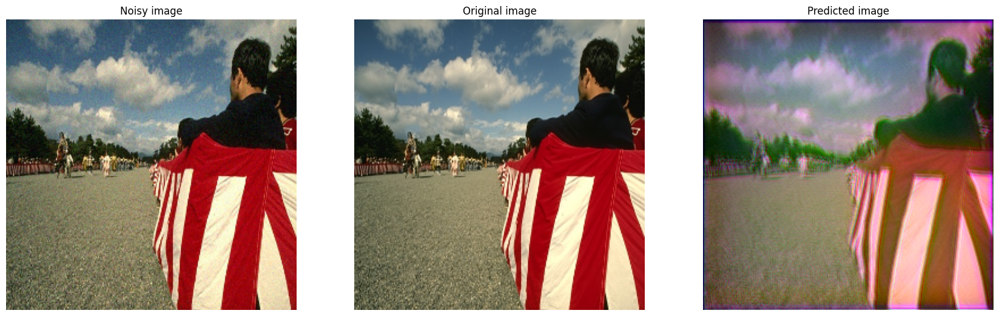

In [69]:
org_images, noisy_images10, predicted_images10 = visualize_predictions(model, noisy_images, org_images, 25)

## Calculte MSE and SSIM

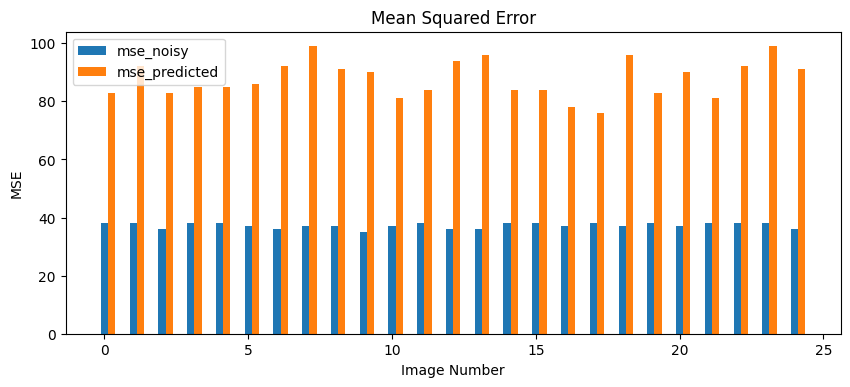

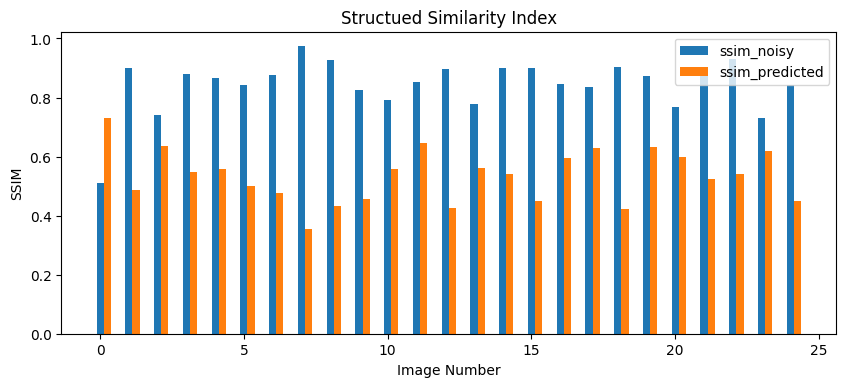

In [51]:
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
from matplotlib import rcParams

# Adjust figure sizes
plt.rcParams['figure.figsize'] = [14, 10]
plt.rcParams['figure.dpi'] = 100 


ls_mse_noisy = []
ls_mse_predict = []
ls_ssim_noisy = []
ls_ssim_predict = []


for org_img, noisy_img, predicted_img in zip(org_images, noisy_images, predicted_images10):

    predicted_img = (predicted_img*255).astype('uint8')

    # Calculate MSE
    mse_noisy = np.mean((org_img - noisy_img)**2).astype(np.uint8)
    ls_mse_noisy.append(mse_noisy)
    
    mse_pred  = np.mean((org_img - predicted_img)**2).astype(np.uint8)
    ls_mse_predict.append(mse_pred)

    # Calculate SSIM
    ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ls_ssim_noisy.append(ssim_noisy)
    
    ssim_pred = ssim(org_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())
    ls_ssim_predict.append(ssim_pred)

    

#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.25

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_mse_noisy, 0.25, label='mse_noisy')
plt.bar(X_axis2, ls_mse_predict, 0.25, label='mse_predicted')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_ssim_noisy, 0.25, label='ssim_noisy')
plt.bar(X_axis2, ls_ssim_predict, 0.25, label='ssim_predicted')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    

# Noisy25 - Denoise the images using Deep Learning model

In [29]:
# Access Noisy50 images
root25 = pathlib.Path('Task-A-Dataset-denoising/noisy25')
img_paths25 = list(root25.rglob("*.png*"))
img_paths_lst25 = [str(path) for path in img_paths25]

noisy_array25 = np.asarray(img_paths_lst25)


In [30]:
# Read images into array
noisy_images25 = get_images_in_mem(noisy_array25)
org_images = get_images_in_mem(org_array)

print(noisy_images25.shape)
print(org_images.shape)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

(25, 256, 256, 3)
(25, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


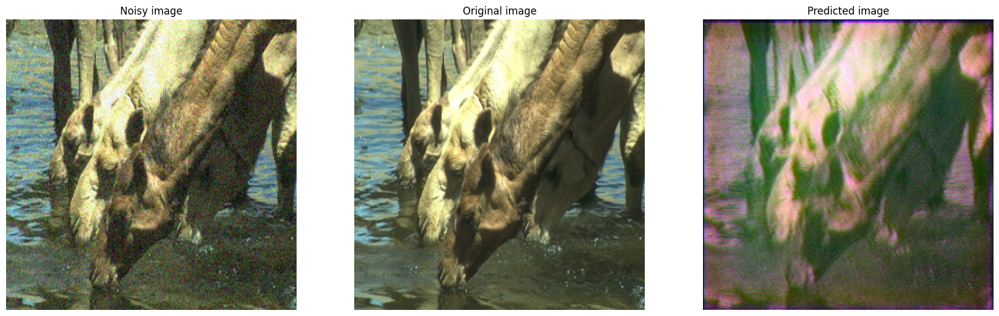

In [53]:
org_images, noisy_images25, predicted_images25 = visualize_predictions(model, noisy_images25, org_images, 25)

## Calculte MSE and SSIM

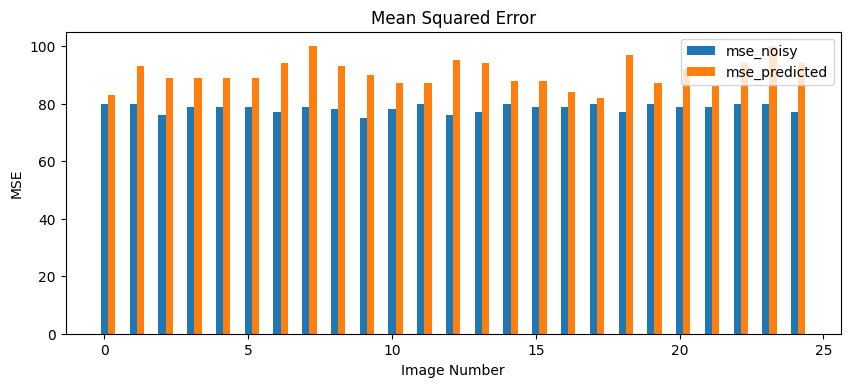

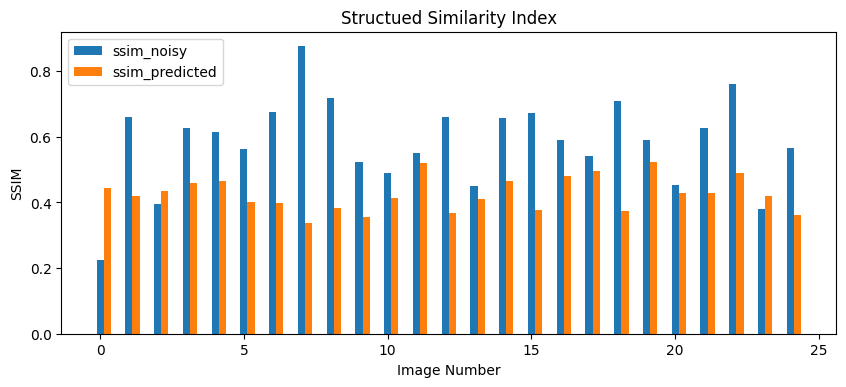

In [54]:
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
from matplotlib import rcParams

# Adjust figure sizes
plt.rcParams['figure.figsize'] = [14, 10]
plt.rcParams['figure.dpi'] = 100 


ls_mse_noisy25 = []
ls_mse_predict25 = []
ls_ssim_noisy25 = []
ls_ssim_predict25 = []

#------------------------------------------------
# Calculate SME and SSIM for Noisy25 images
#------------------------------------------------
for org_img, noisy_img, predicted_img in zip(org_images, noisy_images25, predicted_images25):

    predicted_img = (predicted_img*255).astype('uint8')

    # Calculate MSE
    mse_noisy = np.mean((org_img - noisy_img)**2).astype(np.uint8)
    ls_mse_noisy25.append(mse_noisy)
    
    mse_pred  = np.mean((org_img - predicted_img)**2).astype(np.uint8)
    ls_mse_predict25.append(mse_pred)

    # Calculate SSIM
    ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ls_ssim_noisy25.append(ssim_noisy)
    
    ssim_pred = ssim(org_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())
    ls_ssim_predict25.append(ssim_pred)

    

#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.25

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_mse_noisy25, 0.25, label='mse_noisy')
plt.bar(X_axis2, ls_mse_predict25, 0.25, label='mse_predicted')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_ssim_noisy25, 0.25, label='ssim_noisy')
plt.bar(X_axis2, ls_ssim_predict25, 0.25, label='ssim_predicted')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    


# Noisy50 - Denoise the images using Deep Learning model

In [33]:
# Read Noisy50 images 
root50 = pathlib.Path('Task-A-Dataset-denoising/noisy50')
img_paths50 = list(root50.rglob("*.png*"))
img_paths_lst50 = [str(path) for path in img_paths50]

noisy_array50 = np.asarray(img_paths_lst50)


In [34]:
# Read images into array
noisy_images50 = get_images_in_mem(noisy_array50)
org_images = get_images_in_mem(org_array)

print(noisy_images50.shape)
print(org_images.shape)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

(25, 256, 256, 3)
(25, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


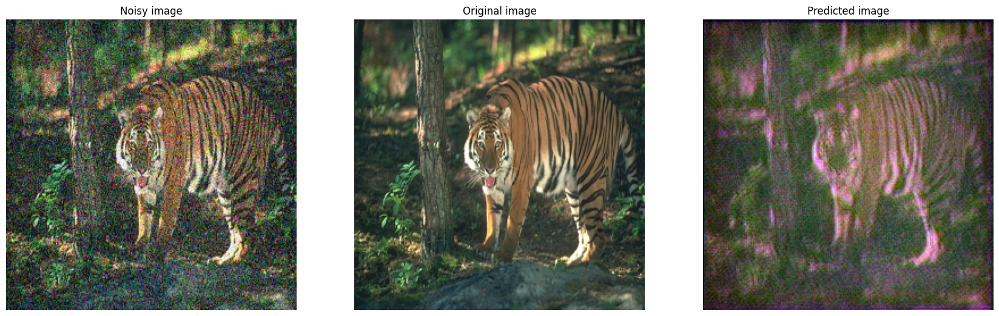

In [71]:
org_images, noisy_images50, predicted_images50 = visualize_predictions(model, noisy_images50, org_images, 25)

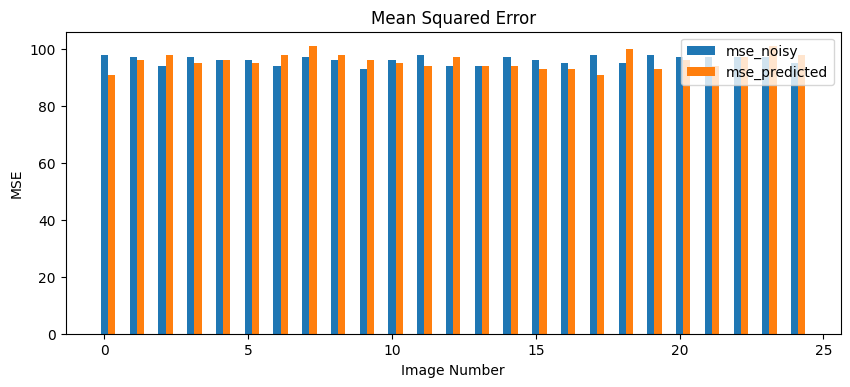

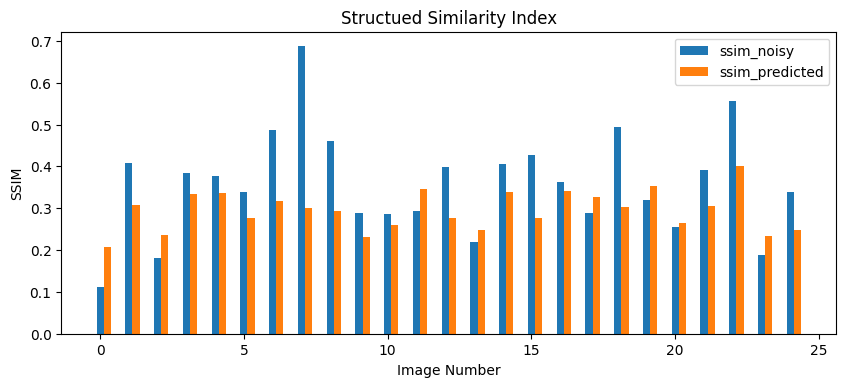

In [57]:
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
from matplotlib import rcParams

# Adjust figure sizes
plt.rcParams['figure.figsize'] = [14, 10]
plt.rcParams['figure.dpi'] = 100 


ls_mse_noisy50 = []
ls_mse_predict50 = []
ls_ssim_noisy50 = []
ls_ssim_predict50 = []

#------------------------------------------------
# Calculate SME and SSIM for Noisy25 images
#------------------------------------------------
for org_img, noisy_img, predicted_img in zip(org_images, noisy_images50, predicted_images50):

    predicted_img = (predicted_img*255).astype('uint8')
    
    # Calculate MSE
    mse_noisy = np.mean((org_img - noisy_img)**2).astype(np.uint8)
    ls_mse_noisy50.append(mse_noisy)
    
    mse_pred  = np.mean((org_img - predicted_img)**2).astype(np.uint8)
    ls_mse_predict50.append(mse_pred)

    # Calculate SSIM
    ssim_noisy = ssim(org_img, noisy_img, multichannel=True, data_range=noisy_img.max() - noisy_img.min())
    ls_ssim_noisy50.append(ssim_noisy)
    
    ssim_pred = ssim(org_img, predicted_img, multichannel=True, data_range=predicted_img.max() - predicted_img.min())
    ls_ssim_predict50.append(ssim_pred)

    

#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.25

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_mse_noisy50, 0.25, label='mse_noisy')
plt.bar(X_axis2, ls_mse_predict50, 0.25, label='mse_predicted')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, ls_ssim_noisy50, 0.25, label='ssim_noisy')
plt.bar(X_axis2, ls_ssim_predict50, 0.25, label='ssim_predicted')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    



# Comparing Overall Results 

## Comparing Noisy10 images for all 4 filters on same plot

# Noisy10 - Comparing Results 

#### Comparing the results to check which filter is giving best result (High Structured Similarity Index) for 3x3 filtered and bayes method filtered images

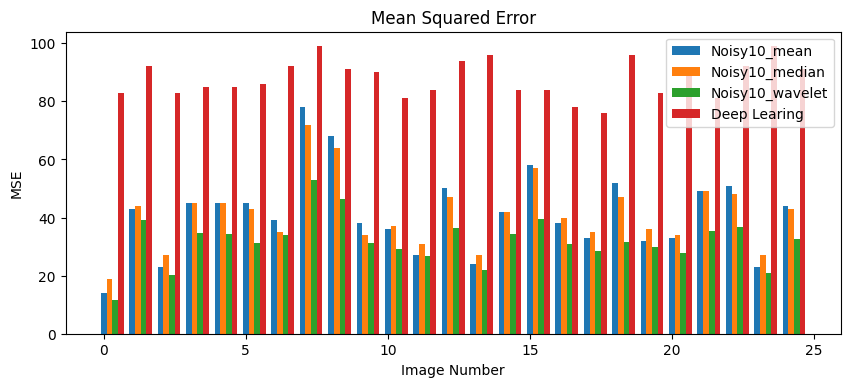

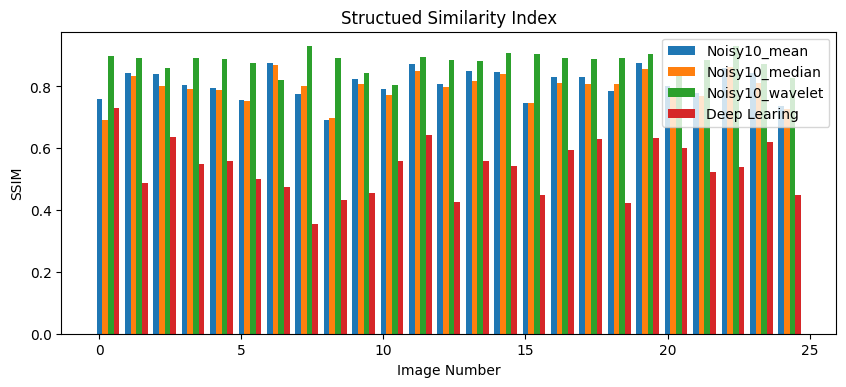

In [37]:
#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.2
X_axis3 = X_axis+0.2*2
X_axis4 = X_axis+0.2*3

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, n10_mse_mean_3x3, 0.2, label='Noisy10_mean')
plt.bar(X_axis2, n10_mse_med_3x3, 0.2, label='Noisy10_median')
plt.bar(X_axis3, n10_mse_bayes, 0.2, label='Noisy10_wavelet')
plt.bar(X_axis4, ls_mse_predict, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, n10_ssim_mean_3x3, 0.2, label='Noisy10_mean')
plt.bar(X_axis2, n10_ssim_med_3x3, 0.2, label='Noisy10_median')
plt.bar(X_axis3, n10_ssim_bayes, 0.2, label='Noisy10_wavelet')
plt.bar(X_axis4, ls_ssim_predict, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    


## Comparing Improvements in Noisy10 Images

In [38]:
##########################################################################################
#    MSE MEAN CALCULATION FOR NOISY10
##########################################################################################

tot_n10_mean=0
tot_n10_med=0
tot_n10_bayes=0
tot_n10_model=0
tot_n10_noisy=0


for n10_mean, n10_med, n10_bayes, n10_model, n10_noisy in zip(n10_mse_mean_3x3, n10_mse_med_3x3, n10_mse_bayes, 
                                                              ls_mse_predict, n10_mean_noisy):
                                                              
    tot_n10_mean = tot_n10_mean + n10_mean
    tot_n10_med  = tot_n10_med + n10_med
    tot_n10_bayes = tot_n10_mean+ n10_bayes
    tot_n10_model = tot_n10_model + n10_model
    tot_n10_noisy = tot_n10_noisy + n10_noisy
    
avg_n10_mean_mse = tot_n10_mean/len(n10_mse_mean_3x3)
avg_n10_med_mse  = tot_n10_med/len(n10_mse_med_3x3)
avg_n10_bayes_mse = tot_n10_bayes/len(n10_mse_bayes)
avg_n10_model_mse = tot_n10_model/len(ls_mse_predict)
avg_n10_noisy_mse = tot_n10_noisy/len(n10_mean_noisy)


##########################################################################################
#    SSIM MEAN CALCULATION FOR NOISY10
##########################################################################################

tot_n10_mean_ssim=0
tot_n10_med_ssim=0
tot_n10_bayes_ssim=0
tot_n10_model_ssim=0
tot_n10_noisy_ssim=0

for n10_mean_ssim, n10_med_ssim, n10_bayes_ssim, n10_model_ssim, n10_noisy_ssim in zip(n10_ssim_mean_3x3,  \
                                           n10_ssim_med_3x3, n10_ssim_bayes, ls_ssim_predict, n10_ssim_noisy):
                                                              
    tot_n10_mean_ssim = tot_n10_mean_ssim + n10_mean_ssim
    tot_n10_med_ssim  = tot_n10_med_ssim + n10_med_ssim
    tot_n10_bayes_ssim = tot_n10_mean_ssim+ n10_bayes_ssim
    tot_n10_model_ssim = tot_n10_model_ssim + n10_model_ssim
    tot_n10_noisy_ssim = tot_n10_noisy_ssim + n10_noisy_ssim
    
avg_n10_mean_ssim = tot_n10_mean_ssim/len(n10_ssim_mean_3x3)
avg_n10_med_ssim  = tot_n10_med_ssim/len(n10_ssim_med_3x3)
avg_n10_bayes_ssim = tot_n10_bayes_ssim/len(n10_ssim_bayes)
avg_n10_model_ssim = tot_n10_model_ssim/len(ls_ssim_predict)
avg_n10_noisy_ssim = tot_n10_noisy_ssim/len(n10_ssim_noisy)




print("-------MSE---------------")

print(avg_n10_noisy_mse)
print(avg_n10_mean_mse)
print(avg_n10_med_mse)
print(avg_n10_bayes_mse)
print(avg_n10_model_mse)


print("-------SSIM---------------")

print(avg_n10_noisy_ssim)
print(avg_n10_mean_ssim)
print(avg_n10_med_ssim)
print(avg_n10_bayes_ssim)
print(avg_n10_model_ssim)


-------MSE---------------
58.72
41.2
41.12
42.503205980962996
87.8
-------SSIM---------------
0.7174192303805442
0.8089411629741673
0.7958311134853728
0.842061185700651
0.5349461736933903


In [39]:
from prettytable import PrettyTable

pt = PrettyTable()
print("Improvements with respect to different filter types over Noisy10 images shown as below:")
pt.field_names = ["Filter", "MSE", "SSIM", "MSE Improvement", "SSIM improvement"]

pt.add_row(["Noisy Images","58.72","0.71","-","-"])
pt.add_row(["Mean 3x3 Filter","41.2","0.80", "17.52","0.09"])
pt.add_row(["Median 3x3 Filter","41.12","0.79","17.6","0.08"])
pt.add_row(["Wavelet Bayes","42.49","0.84","16.23","0.13"])
pt.add_row(["Deep Learning Model","87.8","0.53","-29.08","-0.18"])
pt.align = "r"

print(pt)

Improvements with respect to different filter types over Noisy10 images shown as below:
+---------------------+-------+------+-----------------+------------------+
|              Filter |   MSE | SSIM | MSE Improvement | SSIM improvement |
+---------------------+-------+------+-----------------+------------------+
|        Noisy Images | 58.72 | 0.71 |               - |                - |
|     Mean 3x3 Filter |  41.2 | 0.80 |           17.52 |             0.09 |
|   Median 3x3 Filter | 41.12 | 0.79 |            17.6 |             0.08 |
|       Wavelet Bayes | 42.49 | 0.84 |           16.23 |             0.13 |
| Deep Learning Model |  87.8 | 0.53 |          -29.08 |            -0.18 |
+---------------------+-------+------+-----------------+------------------+


# Noisy25 - Comparing Results 

#### Comparing the results to check which filter is giving best result (Less MSE and high Structured Similarity Index) for 3x3 filtered and bayes method filtered images

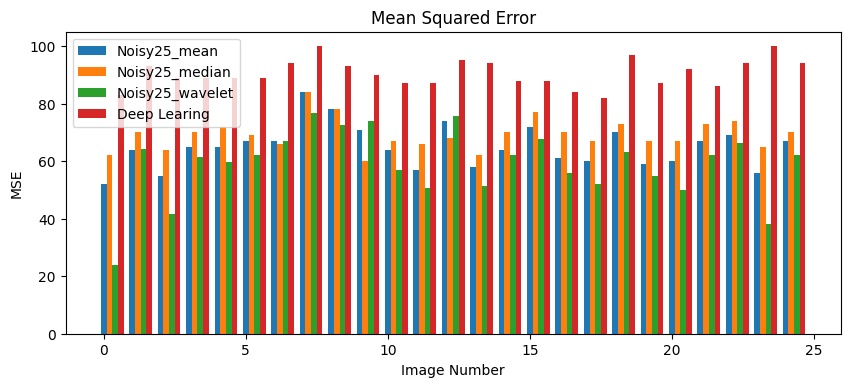

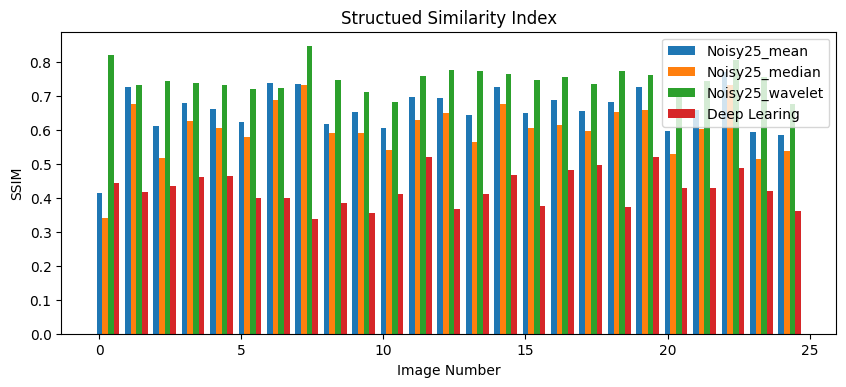

In [40]:
#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.2
X_axis3 = X_axis+0.2*2
X_axis4 = X_axis+0.2*3

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, n25_mse_mean_3x3, 0.2, label='Noisy25_mean')
plt.bar(X_axis2, n25_mse_med_3x3, 0.2, label='Noisy25_median')
plt.bar(X_axis3, n25_mse_bayes, 0.2, label='Noisy25_wavelet')
plt.bar(X_axis4, ls_mse_predict25, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, n25_ssim_mean_3x3, 0.2, label='Noisy25_mean')
plt.bar(X_axis2, n25_ssim_med_3x3, 0.2, label='Noisy25_median')
plt.bar(X_axis3, n25_ssim_bayes, 0.2, label='Noisy25_wavelet')
plt.bar(X_axis4, ls_ssim_predict25, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    


In [41]:
##########################################################################################
#    MSE MEAN CALCULATION FOR NOISY25
##########################################################################################

tot_n25_noisy=0
tot_n25_mean=0
tot_n25_med=0
tot_n25_bayes=0
tot_n25_model=0


for n25_mean, n25_med, n25_bayes, n25_model, n25_noisy in zip(n25_mse_mean_3x3, n25_mse_med_3x3, n25_mse_bayes, \
                            ls_mse_predict25, n25_mean_noisy):
    
    tot_n25_noisy = tot_n25_noisy + n25_noisy
    tot_n25_mean = tot_n25_mean + n25_mean
    tot_n25_med  = tot_n25_med + n25_med
    tot_n25_bayes = tot_n25_mean+ n25_bayes
    tot_n25_model = tot_n25_model + n25_model

    
avg_n25_mean_mse = tot_n25_mean/len(n25_mse_mean_3x3)
avg_n25_med_mse  = tot_n25_med/len(n25_mse_med_3x3)
avg_n25_bayes_mse = tot_n25_bayes/len(n25_mse_bayes)
avg_n25_noisy_mse = tot_n25_noisy/len(n25_mean_noisy)
avg_n25_model_mse = tot_n25_model/len(ls_ssim_predict25)

##########################################################################################
#    SSIM MEAN CALCULATION FOR NOISY25
##########################################################################################

tot_n25_mean_ssim=0
tot_n25_med_ssim=0
tot_n25_bayes_ssim=0
tot_n25_noisy_ssim=0
tot_n25_model_ssim=0

for n25_mean_ssim, n25_med_ssim, n25_bayes_ssim, n25_model_ssim, n25_noisy_ssim in zip(n25_ssim_mean_3x3, n25_ssim_med_3x3\
                                    ,n25_ssim_bayes,  ls_ssim_predict25, n25_ssim_noisy):
    tot_n25_mean_ssim = tot_n25_mean_ssim + n25_mean_ssim
    tot_n25_med_ssim  = tot_n25_med_ssim + n25_med_ssim
    tot_n25_bayes_ssim = tot_n25_mean_ssim+ n25_bayes_ssim
    tot_n25_model_ssim = tot_n25_model_ssim + n25_model_ssim
    tot_n25_noisy_ssim = tot_n25_noisy_ssim + n25_noisy_ssim
    
avg_n25_mean_ssim = tot_n25_mean_ssim/len(n25_ssim_mean_3x3)
avg_n25_med_ssim  = tot_n25_med_ssim/len(n25_ssim_med_3x3)
avg_n25_bayes_ssim = tot_n25_bayes_ssim/len(n25_ssim_bayes)
avg_n25_model_ssim = tot_n25_model_ssim/len(ls_ssim_predict25)
avg_n25_noisy_ssim = tot_n25_noisy_ssim/len(n25_ssim_noisy)



print("-------MSE---------------")

print(avg_n25_noisy_mse)
print(avg_n25_mean_mse)
print(avg_n25_med_mse)
print(avg_n25_bayes_mse)
print(avg_n25_model_mse)

print("-------SSIM---------------")

print(avg_n25_noisy_ssim)
print(avg_n25_mean_ssim)
print(avg_n25_med_ssim)
print(avg_n25_bayes_ssim)
print(avg_n25_model_ssim)

-------MSE---------------
90.96
65.04
69.24
67.522429690654
90.56
-------SSIM---------------
0.41297201327364663
0.6579397324321303
0.6027186648673752
0.685041928196105
0.4264892943921074


In [42]:
from prettytable import PrettyTable

pt = PrettyTable()
print("Improvements with respect to different filter type over Noisy25 images shown as below:")
pt.field_names = ["Filter", "MSE", "SSIM", "MSE Improvement", "SSIM improvement"]

pt.add_row(["Noisy Images","90.96","0.41","-","-"])
pt.add_row(["Mean 3x3 Filter","65.04","0.65", "25.92","0.24"])
pt.add_row(["Median 3x3 Filter","69.24","0.60","21.72","0.19"])
pt.add_row(["Wavelet Bayes","67.50","0.68","23.46","0.27"])
pt.add_row(["Deep Learning Model","90.56","0.42","0.40","0.01"])
pt.align = "r"

print(pt)

Improvements with respect to different filter type over Noisy25 images shown as below:
+---------------------+-------+------+-----------------+------------------+
|              Filter |   MSE | SSIM | MSE Improvement | SSIM improvement |
+---------------------+-------+------+-----------------+------------------+
|        Noisy Images | 90.96 | 0.41 |               - |                - |
|     Mean 3x3 Filter | 65.04 | 0.65 |           25.92 |             0.24 |
|   Median 3x3 Filter | 69.24 | 0.60 |           21.72 |             0.19 |
|       Wavelet Bayes | 67.50 | 0.68 |           23.46 |             0.27 |
| Deep Learning Model | 90.56 | 0.42 |            0.40 |             0.01 |
+---------------------+-------+------+-----------------+------------------+


# Noisy50 - Comparing Results 

#### Comparing the results to check which filter is giving best result (Less MSE and high Structured Similarity Index) for 5x5 filtered and bayes method filtered images

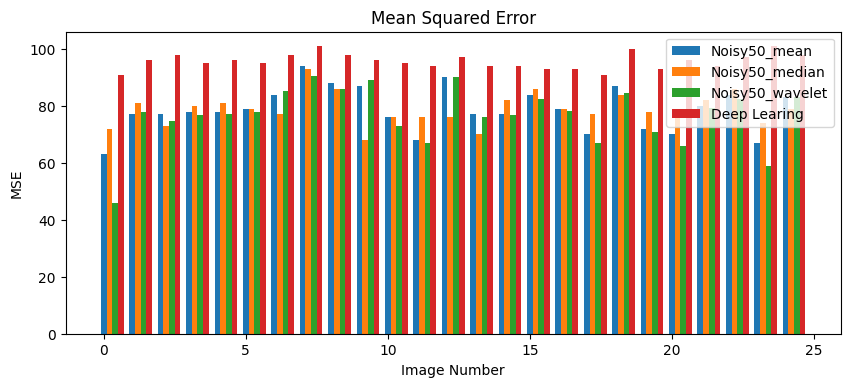

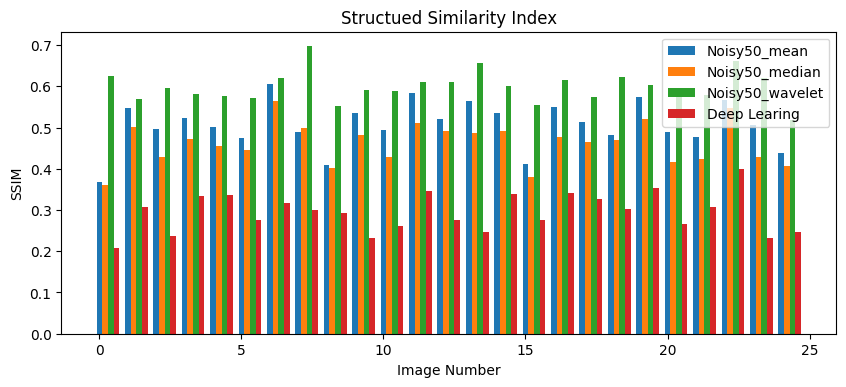

In [60]:
#------------------------------------
# Plots
#------------------------------------
#Adjust figure sizes
rcParams['figure.figsize'] = [10, 4]
plt.rcParams['figure.dpi'] = 100
X_axis=np.arange(0,25)
X_axis1 = X_axis
X_axis2 = X_axis + 0.2
X_axis3 = X_axis+0.2*2
X_axis4 = X_axis+0.2*3

#------------------------------------------------------------
# Plot Mean Squared Error for each image
#------------------------------------------------------------
plt.bar(X_axis1, n50_mse_mean_5x5, 0.2, label='Noisy50_mean')
plt.bar(X_axis2, n50_mse_med_5x5, 0.2, label='Noisy50_median')
plt.bar(X_axis3, n50_mse_bayes, 0.2, label='Noisy50_wavelet')
plt.bar(X_axis4, ls_mse_predict50, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#------------------------------------------------------------
# Plot Structued Similarity Index for each image
#------------------------------------------------------------
plt.bar(X_axis1, n50_ssim_mean_5x5, 0.2, label='Noisy50_mean')
plt.bar(X_axis2, n50_ssim_med_5x5, 0.2, label='Noisy50_median')
plt.bar(X_axis3, n50_ssim_bayes, 0.2, label='Noisy50_wavelet')
plt.bar(X_axis4, ls_ssim_predict50, 0.2, label='Deep Learing')
plt.xlabel('Image Number')
plt.ylabel('SSIM')
plt.title('Structued Similarity Index')
plt.legend()
plt.show()    


In [58]:
##########################################################################################
#    MSE MEAN CALCULATION FOR NOISY50
##########################################################################################

tot_n50_noisy=0
tot_n50_mean=0
tot_n50_med=0
tot_n50_bayes=0
tot_n50_model=0

for n50_mean, n50_med, n50_bayes, n50_model, n50_noisy in zip(n50_mse_mean_5x5, n50_mse_med_5x5, n50_mse_bayes, \
                              ls_mse_predict50, n50_mean_noisy):
    
    tot_n50_noisy = tot_n50_noisy + n50_noisy
    tot_n50_mean = tot_n50_mean + n50_mean
    tot_n50_med  = tot_n50_med + n50_med
    tot_n50_bayes = tot_n50_mean+ n50_bayes
    tot_n50_model = tot_n50_model + n50_model

    
avg_n50_mean_mse = tot_n50_mean/len(n50_mse_mean_5x5)
avg_n50_med_mse  = tot_n50_med/len(n50_mse_med_5x5)
avg_n50_bayes_mse = tot_n50_bayes/len(n50_mse_bayes)
avg_n50_model_mse = tot_n50_model/len(ls_mse_predict50)
avg_n50_noisy_mse = tot_n50_noisy/len(n50_mean_noisy)


##########################################################################################
#    SSIM MEAN CALCULATION FOR NOISY50
##########################################################################################


tot_n50_mean_ssim=0
tot_n50_med_ssim=0
tot_n50_bayes_ssim=0
tot_n50_model_ssim=0
tot_n50_noisy_ssim=0

for n50_mean_ssim, n50_med_ssim, n50_bayes_ssim, n50_model_ssim, n50_noisy_ssim in zip(n50_ssim_mean_5x5,n50_ssim_med_5x5 \
                                              ,n50_ssim_bayes, ls_ssim_predict50, n50_ssim_noisy):
    tot_n50_mean_ssim = tot_n50_mean_ssim + n50_mean_ssim
    tot_n50_med_ssim  = tot_n50_med_ssim + n50_med_ssim
    tot_n50_bayes_ssim = tot_n50_mean_ssim+ n50_bayes_ssim
    tot_n50_model_ssim = tot_n50_model_ssim + n50_model_ssim
    tot_n50_noisy_ssim = tot_n50_noisy_ssim + n50_noisy_ssim


avg_n50_noisy_ssim = tot_n50_noisy_ssim/len(n50_ssim_noisy)
avg_n50_mean_ssim = tot_n50_mean_ssim/len(n50_ssim_mean_5x5)
avg_n50_med_ssim  = tot_n50_med_ssim/len(n50_ssim_med_5x5)
avg_n50_bayes_ssim = tot_n50_bayes_ssim/len(n50_ssim_bayes)
avg_n50_model_ssim = tot_n50_model_ssim/len(ls_ssim_predict50)



print("-------MSE---------------")

print(avg_n50_noisy_mse)
print(avg_n50_mean_mse)
print(avg_n50_med_mse)
print(avg_n50_bayes_mse)
print(avg_n50_model_mse)



print("-------SSIM---------------")

print(avg_n50_noisy_ssim)
print(avg_n50_mean_ssim)
print(avg_n50_med_ssim)
print(avg_n50_bayes_ssim)
print(avg_n50_model_ssim)


-------MSE---------------
101.64
78.76
78.88
82.08486870767246
95.76
-------SSIM---------------
0.21678269204967077
0.5063902539123992
0.4621759008081467
0.5270886060654637
0.2941955974704848


In [59]:
from prettytable import PrettyTable

pt = PrettyTable()
print("Improvements with respect to different filter types over Noisy50 images shown as below:")
pt.field_names = ["Filter", "MSE", "SSIM", "MSE Improvement", "SSIM improvement"]

pt.add_row(["Noisy Images","101.64","0.21","-","-"])
pt.add_row(["Mean 5x5 Filter","78.76","0.50", "22.88","0.29"])
pt.add_row(["Median 5x5 Filter","78.88","0.46","22.76","0.25"])
pt.add_row(["Wavelet Bayes","82.09","0.52","19.55","0.31"])
pt.add_row(["Deep Learning Model","95.76","0.29","5.88","0.08"])
pt.align = "r"

print(pt)

Improvements with respect to different filter types over Noisy50 images shown as below:
+---------------------+--------+------+-----------------+------------------+
|              Filter |    MSE | SSIM | MSE Improvement | SSIM improvement |
+---------------------+--------+------+-----------------+------------------+
|        Noisy Images | 101.64 | 0.21 |               - |                - |
|     Mean 5x5 Filter |  78.76 | 0.50 |           22.88 |             0.29 |
|   Median 5x5 Filter |  78.88 | 0.46 |           22.76 |             0.25 |
|       Wavelet Bayes |  82.09 | 0.52 |           19.55 |             0.31 |
| Deep Learning Model |  95.76 | 0.29 |            5.88 |             0.08 |
+---------------------+--------+------+-----------------+------------------+
